# Machine Learning - SVM

* SVM aplicado na classificação de Vinho.
* O SVM será utilizado para criação de classificador que identifica Se o vinho é Tinto ou Branco.
* Iremos treinar o algoritmo, validar o modelo e fazer tunning dos parâmetros do SVM.

# Informações da Base de dados.

- A base de dados de **Wine**

# https://www.kaggle.com/dell4010/wine-dataset


**Informações sobre atributos:**

1 - acidez fixa 2 - acidez volátil 3 - ácido cítrico 4 - açúcar residual 5 - cloretos 6 - dióxido de enxofre livre 7 - dióxido de enxofre total 8 - densidade 9 - pH 10 - sulfatos 11 - álcool Variável de saída (com base em dados sensoriais): 12 - qualidade (pontuação entre 0 e 10)

estilo - 0 ou 1 Vinho Tinto ou Vinho Branco

**Bibliotecas utilizadas**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

from pandas_profiling import ProfileReport
import pandas_profiling
from pandas import read_csv
import sweetviz as sv

from sklearn.model_selection import cross_val_predict
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn import datasets

%matplotlib inline

import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

In [2]:
 # lista estilos disponíveis do Matplotlib
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

In [3]:
#definições vinho 

#neste caso 0 é red e  1 é white

**Importando dataset Wine**

In [4]:
df = pd.read_csv('wine_dataset.csv')

# Informações básicas
print(f'Registros: {len(df)}\nVariáveis: {len(df.columns)}')

# Mostrar todas as colunas da base:
pd.set_option('display.max_columns', None)



Registros: 6497
Variáveis: 13


In [5]:
type(df)

pandas.core.frame.DataFrame

In [6]:
# Visualizando 
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,style
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [7]:
# substitui variaveis
df['style']= df['style'].replace('red',0)
df['style']= df['style'].replace('white',1)

In [8]:
# Pandas Profiling Relatório

profile = ProfileReport(df, title='Relatório Wine-Vinho', html={'style':{'full_width':True}})

profile.to_notebook_iframe()

profile.to_file(output_file="Relatório Wine-Vinho")

In [9]:
## ## Sweetviz  Relatório
my_report = sv.analyze(df) # cria o reporte e chama de my_report
my_report.show_html()

# sv.anlyze(df).show_html()


Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [10]:
df.dtypes

fixed_acidity           float64
volatile_acidity        float64
citric_acid             float64
residual_sugar          float64
chlorides               float64
free_sulfur_dioxide     float64
total_sulfur_dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
style                     int64
dtype: object

In [11]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'style'],
      dtype='object')

In [12]:
df.size

84461

In [13]:
# Informações do Dataset - Tipo das Variáveis, Quantidade de linhas (registros) e colunas (variáveis/features)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         6497 non-null   float64
 1   volatile_acidity      6497 non-null   float64
 2   citric_acid           6497 non-null   float64
 3   residual_sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free_sulfur_dioxide   6497 non-null   float64
 6   total_sulfur_dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  style                 6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


In [14]:
#Verifica as dimensões do dataset (antes de vírgula são linhas    ,     depois da vírgula são colunas)
df.shape

(6497, 13)

In [15]:
# Verifique o número de valores diferentes em cada coluna.
df.nunique()

fixed_acidity           106
volatile_acidity        187
citric_acid              89
residual_sugar          316
chlorides               214
free_sulfur_dioxide     135
total_sulfur_dioxide    276
density                 998
pH                      108
sulphates               111
alcohol                 111
quality                   7
style                     2
dtype: int64

In [16]:
len(df)

6497

# Análise de Dados

In [17]:
# Consultando linhas com valore faltantes.
df.isnull().sum().sort_values(ascending=False)

style                   0
quality                 0
alcohol                 0
sulphates               0
pH                      0
density                 0
total_sulfur_dioxide    0
free_sulfur_dioxide     0
chlorides               0
residual_sugar          0
citric_acid             0
volatile_acidity        0
fixed_acidity           0
dtype: int64

In [18]:
df['style'].unique()

array([0, 1], dtype=int64)

In [19]:
# retorna a quantidade de linha de todas as colunas
df.count()

fixed_acidity           6497
volatile_acidity        6497
citric_acid             6497
residual_sugar          6497
chlorides               6497
free_sulfur_dioxide     6497
total_sulfur_dioxide    6497
density                 6497
pH                      6497
sulphates               6497
alcohol                 6497
quality                 6497
style                   6497
dtype: int64

In [25]:
df['style'].value_counts()

1    4898
0    1599
Name: style, dtype: int64

In [ ]:
#Removendo duplicatas se houver
df.drop_duplicates(keep=False, inplace=True)

In [20]:
# Resumo Estatístico da base
# Somente dados numéricos
df.describe().round(2)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,style
count,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00
mean,7.22,0.34,0.32,5.44,0.06,30.53,115.74,0.99,3.22,0.53,10.49,5.82,0.75
std,1.30,0.16,0.15,4.76,0.04,17.75,56.52,0.00,0.16,0.15,1.19,0.87,0.43
min,3.80,0.08,0.00,0.60,0.01,1.00,6.00,0.99,2.72,0.22,8.00,3.00,0.00
25%,6.40,0.23,0.25,1.80,0.04,17.00,77.00,0.99,3.11,0.43,9.50,5.00,1.00
50%,7.00,0.29,0.31,3.00,0.05,29.00,118.00,0.99,3.21,0.51,10.30,6.00,1.00
75%,7.70,0.40,0.39,8.10,0.06,41.00,156.00,1.00,3.32,0.60,11.30,6.00,1.00
max,15.90,1.58,1.66,65.80,0.61,289.00,440.00,1.04,4.01,2.00,14.90,9.00,1.00


In [21]:
#Matriz de correlação - person
df.corr().round(4)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,style
fixed_acidity,1.0000,0.2190,0.3244,-0.1120,0.2982,-0.2827,-0.3291,0.4589,-0.2527,0.2996,-0.0955,-0.0767,-0.4867
volatile_acidity,0.2190,1.0000,-0.3780,-0.1960,0.3771,-0.3526,-0.4145,0.2713,0.2615,0.2260,-0.0376,-0.2657,-0.6530
citric_acid,0.3244,-0.3780,1.0000,0.1425,0.0390,0.1331,0.1952,0.0962,-0.3298,0.0562,-0.0105,0.0855,0.1874
residual_sugar,-0.1120,-0.1960,0.1425,1.0000,-0.1289,0.4029,0.4955,0.5525,-0.2673,-0.1859,-0.3594,-0.0370,0.3488
chlorides,0.2982,0.3771,0.0390,-0.1289,1.0000,-0.1950,-0.2796,0.3626,0.0447,0.3956,-0.2569,-0.2007,-0.5127
free_sulfur_dioxide,-0.2827,-0.3526,0.1331,0.4029,-0.1950,1.0000,0.7209,0.0257,-0.1459,-0.1885,-0.1798,0.0555,0.4716
total_sulfur_dioxide,-0.3291,-0.4145,0.1952,0.4955,-0.2796,0.7209,1.0000,0.0324,-0.2384,-0.2757,-0.2657,-0.0414,0.7004
density,0.4589,0.2713,0.0962,0.5525,0.3626,0.0257,0.0324,1.0000,0.0117,0.2595,-0.6867,-0.3059,-0.3906
pH,-0.2527,0.2615,-0.3298,-0.2673,0.0447,-0.1459,-0.2384,0.0117,1.0000,0.1921,0.1212,0.0195,-0.3291
sulphates,0.2996,0.2260,0.0562,-0.1859,0.3956,-0.1885,-0.2757,0.2595,0.1921,1.0000,-0.0030,0.0385,-0.4872


In [22]:
# Correlação de spearman - leva em consideração  a correlação positiva e negativa
df.corr('spearman').round(4)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,style
fixed_acidity,1.0000,0.2003,0.2706,-0.0323,0.3560,-0.2599,-0.2333,0.4341,-0.2500,0.2201,-0.1107,-0.0982,-0.4237
volatile_acidity,0.2003,1.0000,-0.2951,-0.0644,0.4159,-0.3657,-0.3435,0.2614,0.1949,0.2550,-0.0239,-0.2578,-0.5991
citric_acid,0.2706,-0.2951,1.0000,0.0749,-0.0741,0.1221,0.1594,0.0657,-0.2859,0.0369,0.0197,0.1057,0.1612
residual_sugar,-0.0323,-0.0644,0.0749,1.0000,-0.0358,0.3877,0.4549,0.5267,-0.2293,-0.1382,-0.3292,-0.0169,0.2565
chlorides,0.3560,0.4159,-0.0741,-0.0358,1.0000,-0.2604,-0.2684,0.5907,0.1635,0.3704,-0.4013,-0.2951,-0.6653
free_sulfur_dioxide,-0.2599,-0.3657,0.1221,0.3877,-0.2604,1.0000,0.7414,0.0058,-0.1647,-0.2211,-0.1860,0.0869,0.5201
total_sulfur_dioxide,-0.2333,-0.3435,0.1594,0.4549,-0.2684,0.7414,1.0000,0.0615,-0.2427,-0.2567,-0.3090,-0.0548,0.6762
density,0.4341,0.2614,0.0657,0.5267,0.5907,0.0058,0.0615,1.0000,0.0118,0.2748,-0.6994,-0.3228,-0.4084
pH,-0.2500,0.1949,-0.2859,-0.2293,0.1635,-0.1647,-0.2427,0.0118,1.0000,0.2543,0.1402,0.0325,-0.3365
sulphates,0.2201,0.2550,0.0369,-0.1382,0.3704,-0.2211,-0.2567,0.2748,0.2543,1.0000,0.0046,0.0298,-0.4944


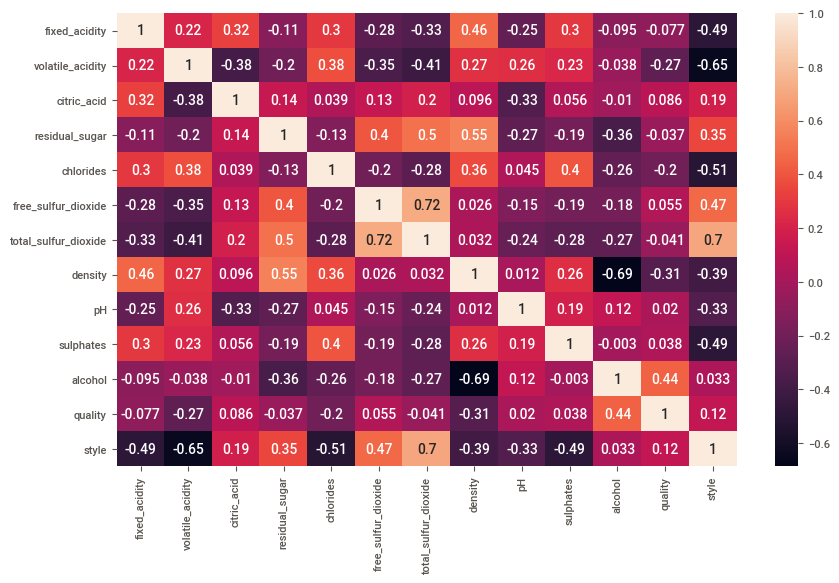

In [23]:
# Mapa de calor
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(),annot=True);

                      fixed_acidity  volatile_acidity  citric_acid  \
fixed_acidity              1.000000          0.219008     0.324436   
volatile_acidity           0.219008          1.000000    -0.377981   
citric_acid                0.324436         -0.377981     1.000000   
residual_sugar            -0.111981         -0.196011     0.142451   
chlorides                  0.298195          0.377124     0.038998   
free_sulfur_dioxide       -0.282735         -0.352557     0.133126   
total_sulfur_dioxide      -0.329054         -0.414476     0.195242   
density                    0.458910          0.271296     0.096154   
pH                        -0.252700          0.261454    -0.329808   
sulphates                  0.299568          0.225984     0.056197   
alcohol                   -0.095452         -0.037640    -0.010493   
quality                   -0.076743         -0.265699     0.085532   
style                     -0.486740         -0.653036     0.187397   

                   

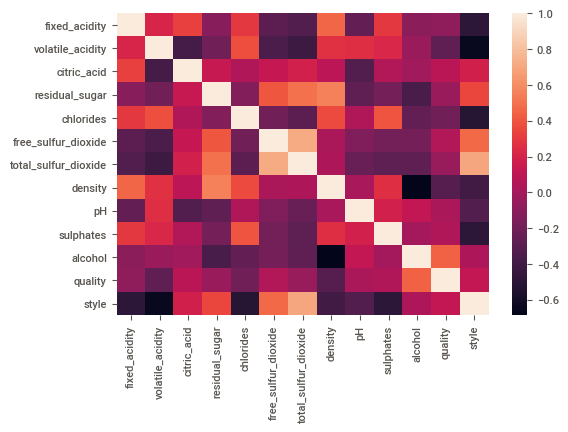

In [24]:
corr = df.corr()
print(corr)
sns.heatmap(corr, 
         xticklabels=corr.columns, 
         yticklabels=corr.columns);

In [26]:
df.corr()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,style
fixed_acidity,1.000000,0.219008,0.324436,-0.111981,0.298195,-0.282735,-0.329054,0.458910,-0.252700,0.299568,-0.095452,-0.076743,-0.486740
volatile_acidity,0.219008,1.000000,-0.377981,-0.196011,0.377124,-0.352557,-0.414476,0.271296,0.261454,0.225984,-0.037640,-0.265699,-0.653036
citric_acid,0.324436,-0.377981,1.000000,0.142451,0.038998,0.133126,0.195242,0.096154,-0.329808,0.056197,-0.010493,0.085532,0.187397
residual_sugar,-0.111981,-0.196011,0.142451,1.000000,-0.128940,0.402871,0.495482,0.552517,-0.267320,-0.185927,-0.359415,-0.036980,0.348821
chlorides,0.298195,0.377124,0.038998,-0.128940,1.000000,-0.195045,-0.279630,0.362615,0.044708,0.395593,-0.256916,-0.200666,-0.512678
free_sulfur_dioxide,-0.282735,-0.352557,0.133126,0.402871,-0.195045,1.000000,0.720934,0.025717,-0.145854,-0.188457,-0.179838,0.055463,0.471644
total_sulfur_dioxide,-0.329054,-0.414476,0.195242,0.495482,-0.279630,0.720934,1.000000,0.032395,-0.238413,-0.275727,-0.265740,-0.041385,0.700357
density,0.458910,0.271296,0.096154,0.552517,0.362615,0.025717,0.032395,1.000000,0.011686,0.259478,-0.686745,-0.305858,-0.390645
pH,-0.252700,0.261454,-0.329808,-0.267320,0.044708,-0.145854,-0.238413,0.011686,1.000000,0.192123,0.121248,0.019506,-0.329129
sulphates,0.299568,0.225984,0.056197,-0.185927,0.395593,-0.188457,-0.275727,0.259478,0.192123,1.000000,-0.003029,0.038485,-0.487218


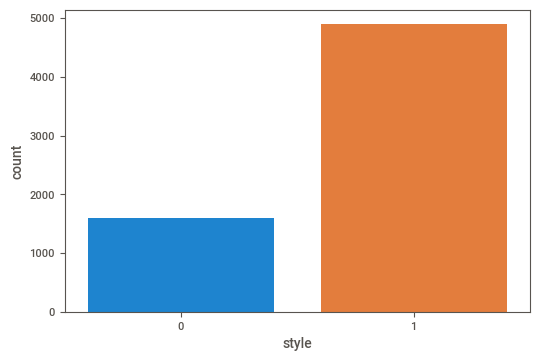

In [27]:
# Cria um gráfico de barras da variável Target
sns.countplot(df['style']);

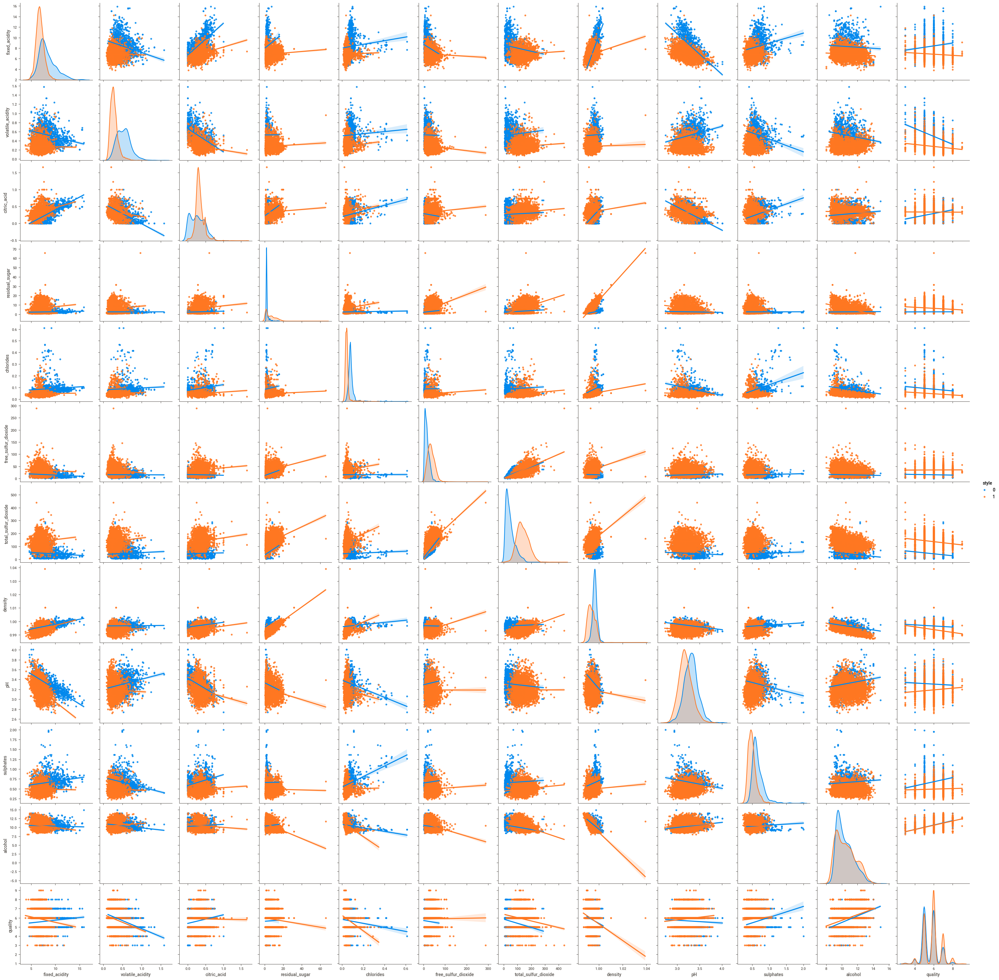

In [28]:
# Criação do Gráfico de dispersão (scatter) conhecido como pairplot
sns.pairplot(df, hue='style', kind="reg"); # kind=reg é a reta de regressão

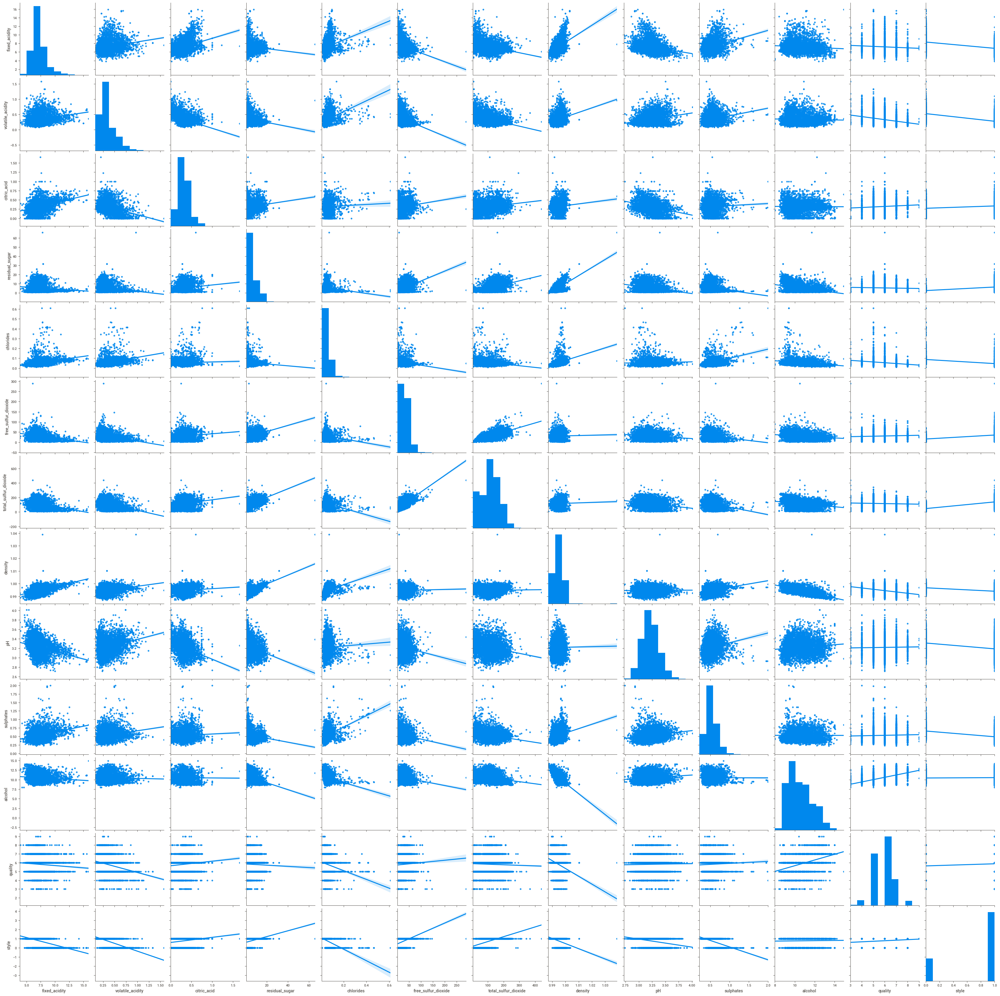

In [29]:
# Criação do Gráfico de dispersão sem agregar pelo TARGET
sns.pairplot(df,kind="reg");

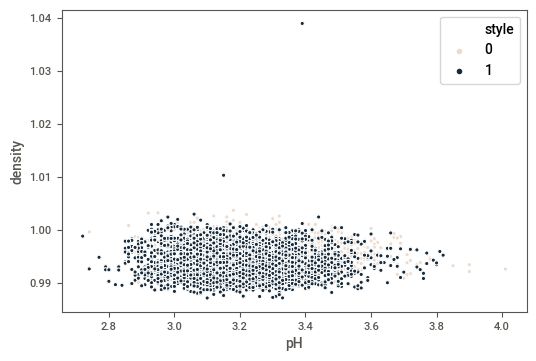

In [30]:
sns.scatterplot(x='pH',  y='density', hue='style',
                data= df, 
                legend = 'full',
                palette="ch:r=-.7,l=.87");

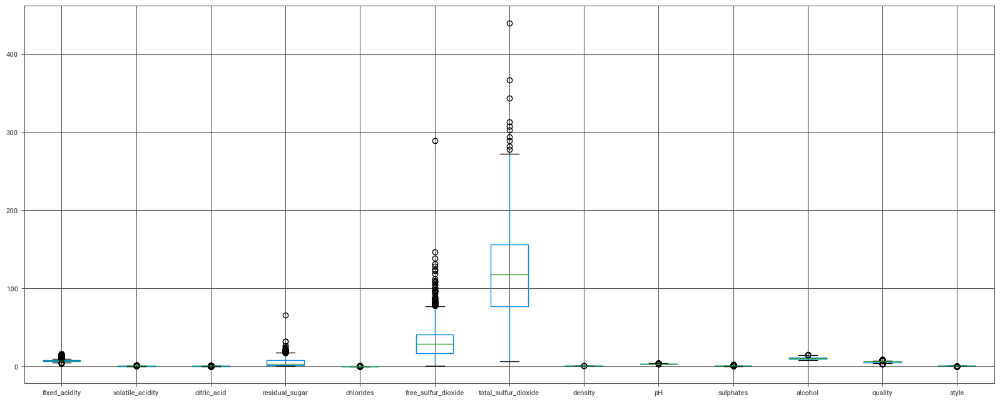

In [31]:
df.boxplot(figsize=(20,8));

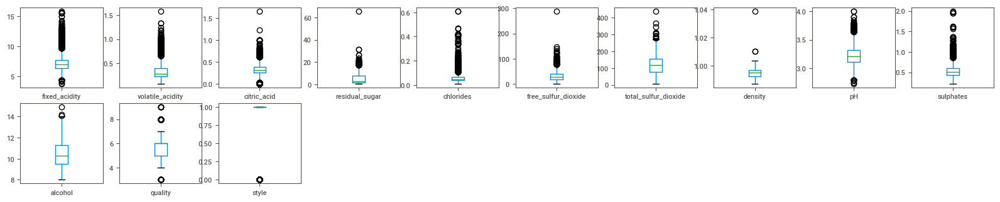

In [32]:
df.plot(kind= 'box' , subplots=True, layout=(10,10), sharex=False, sharey=False, figsize=(20,20));

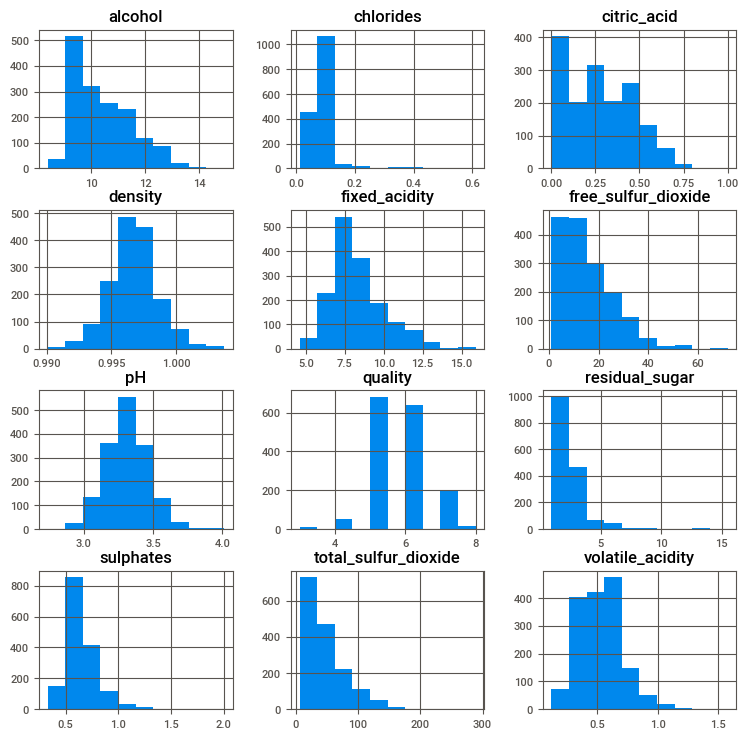

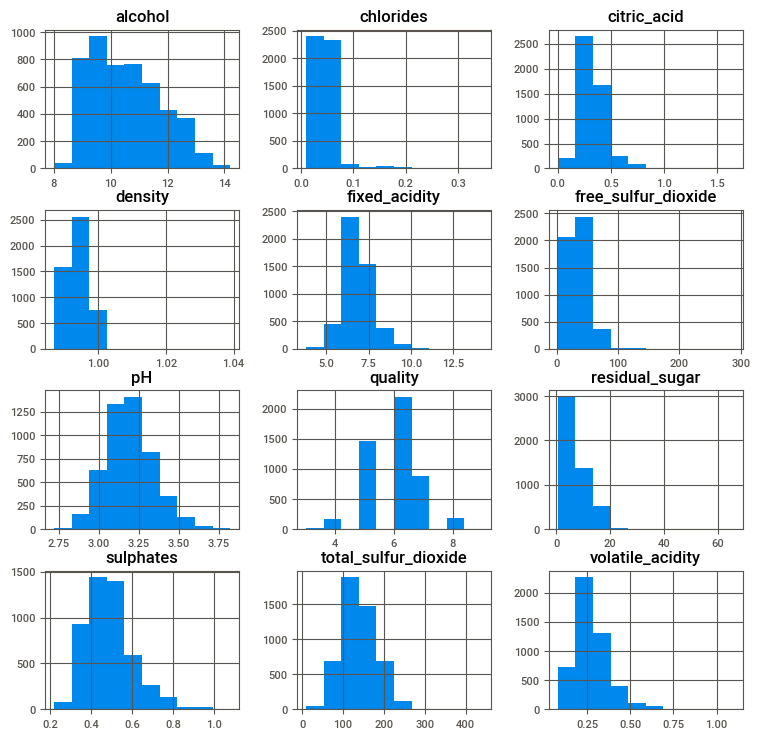

In [33]:
df.groupby('style').hist(figsize=(9, 9));

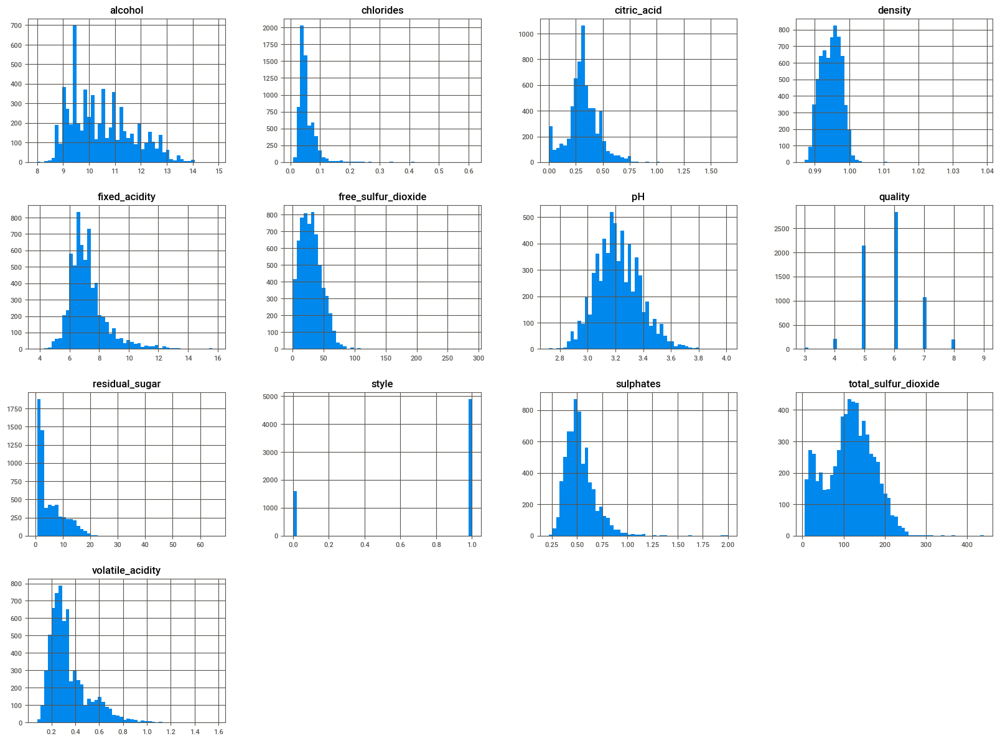

In [34]:
df.hist(bins=50, figsize=(20, 15))
plt.show();

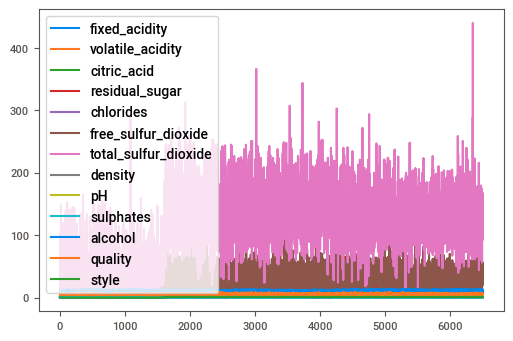

In [35]:
df.plot();

In [36]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'style'],
      dtype='object')

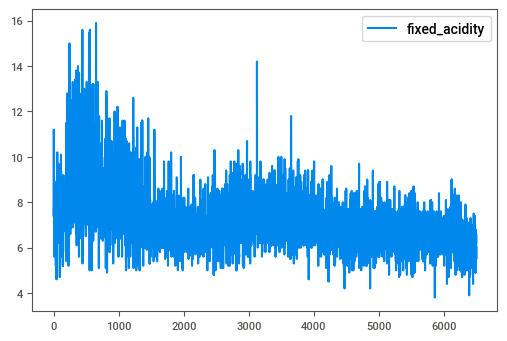

In [37]:
# nível de concentração de acidez fixa por distribuição de registro
df.plot(y='fixed_acidity');

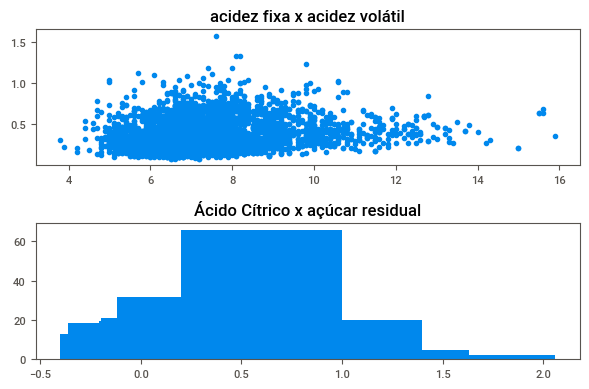

In [38]:
top = plt.subplot2grid((4,4), (0, 0), rowspan=2, colspan=4)
top.scatter(df['fixed_acidity'], df['volatile_acidity'])
plt.title('acidez fixa x acidez volátil')
bottom = plt.subplot2grid((4,4), (2,0), rowspan=2, colspan=4)
bottom.bar(df['citric_acid'], df['residual_sugar'])
plt.title('Ácido Cítrico x açúcar residual')
plt.tight_layout();

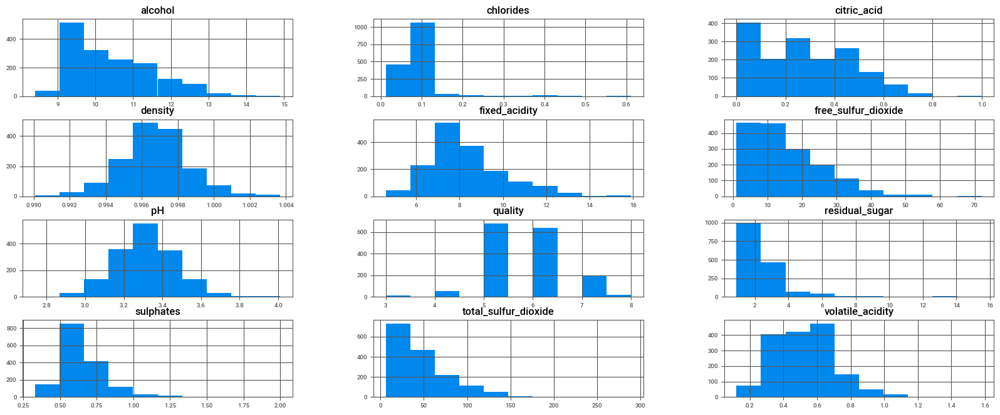

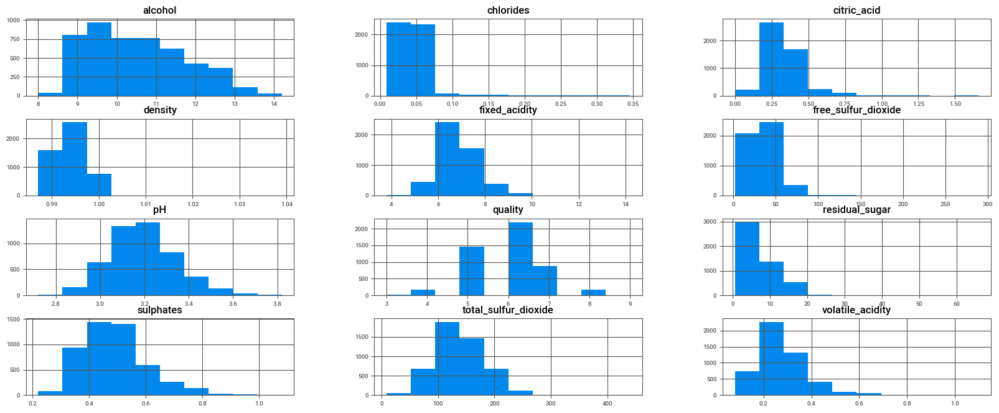

In [39]:
df.groupby('style').hist(figsize=(20,8), xlabelsize=7, ylabelsize=7);

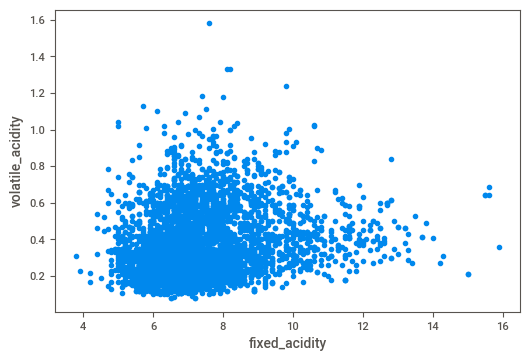

In [40]:
plt.scatter(df.fixed_acidity,df.volatile_acidity)
plt.xlabel('fixed_acidity')
plt.ylabel('volatile_acidity');

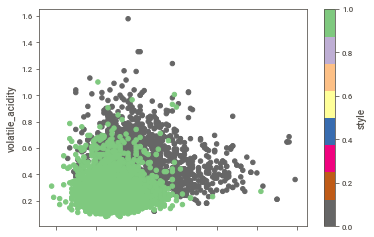

In [41]:
# Grafico de dispersão
# acidez fixa x acidez volátil
# Estilo vinho : Tinto ou Branco
%matplotlib inline
from matplotlib import style
style.use("seaborn-colorblind")
df.plot(x='fixed_acidity', y='volatile_acidity', c='style', kind='scatter', colormap='Accent_r');

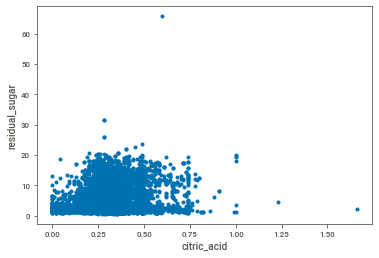

In [42]:
plt.scatter(df.citric_acid,df.residual_sugar)
plt.xlabel('citric_acid')
plt.ylabel('residual_sugar');

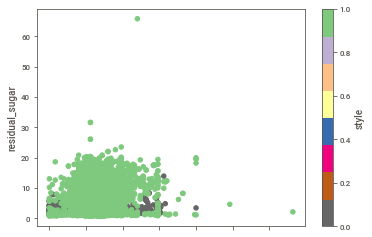

In [43]:
# Ácido Cítrico x açúcar residual 
%matplotlib inline
from matplotlib import style
style.use("seaborn-colorblind")
df.plot(x='citric_acid', y='residual_sugar', c='style', kind='scatter' , colormap='Accent_r');

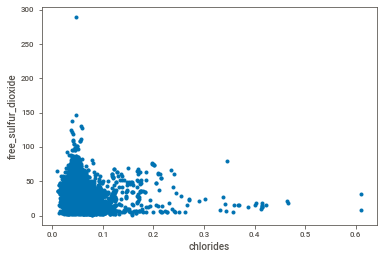

In [44]:
plt.scatter(df.chlorides,df.free_sulfur_dioxide)
plt.xlabel('chlorides')
plt.ylabel('free_sulfur_dioxide');

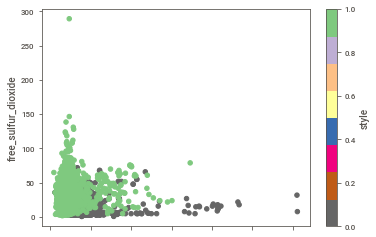

In [45]:
# cloretos x dióxido de enxofre livre
%matplotlib inline
from matplotlib import style
style.use("seaborn-colorblind")
df.plot(x='chlorides', y='free_sulfur_dioxide', c='style', kind='scatter' , colormap='Accent_r');

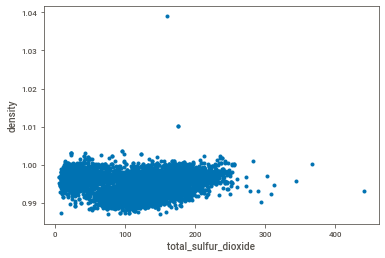

In [46]:
plt.scatter(df.total_sulfur_dioxide,df.density)
plt.xlabel('total_sulfur_dioxide')
plt.ylabel('density');

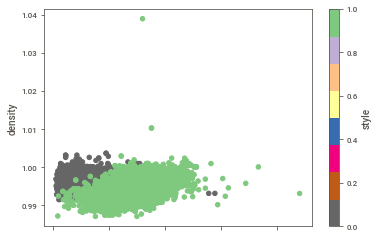

In [47]:
# dióxido de enxofre total x densidade
%matplotlib inline
from matplotlib import style
style.use("seaborn-colorblind")
df.plot(x='total_sulfur_dioxide', y='density', c='style', kind='scatter' , colormap='Accent_r');

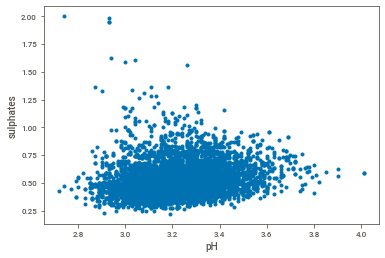

In [48]:
plt.scatter(df.pH,df.sulphates)
plt.xlabel('pH')
plt.ylabel('sulphates');

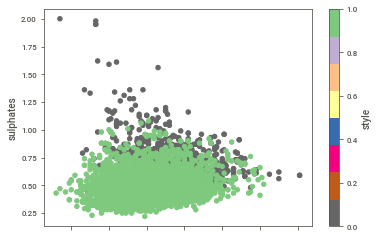

In [49]:
# pH x sulfatos
%matplotlib inline
from matplotlib import style
style.use("seaborn-colorblind")
df.plot(x='pH', y='sulphates', c='style', kind='scatter' , colormap='Accent_r');

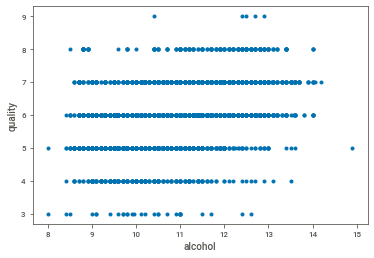

In [50]:
plt.scatter(df.alcohol,df.quality)
plt.xlabel('alcohol')
plt.ylabel('quality');

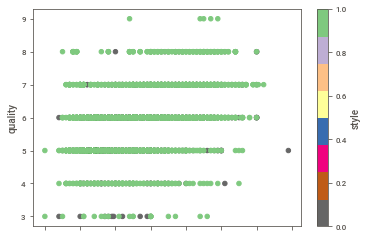

In [51]:
#álcool x qualidade
%matplotlib inline
from matplotlib import style
style.use("seaborn-colorblind")
df.plot(x='alcohol', y='quality', c='style', kind='scatter' , colormap='Accent_r');

# Separa a classe dos dados


In [52]:
# Separando as variaveis entre preditoras e variavel alvo
# style - alvo(y)
# x recebe tudo , menos a coluna style
y = df['style']
x = df.drop('style', axis = 1)

In [53]:
classes = df['style']
df.drop('style', axis=1, inplace=True)

In [54]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


# Pre-processamento de dados

In [55]:
#função para remover colunas
#def remove_features(lista_features):
#    for i in lista_features:
#        dataset.drop(i, axis=1, inplace=True)
 #   return 0

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         6497 non-null   float64
 1   volatile_acidity      6497 non-null   float64
 2   citric_acid           6497 non-null   float64
 3   residual_sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free_sulfur_dioxide   6497 non-null   float64
 6   total_sulfur_dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 609.2 KB


# Cross Validation

In [57]:
# Função que retorna a acurácia após fazer um validação cruzada (cross validation)
def Acuracia(clf,X,y):
    resultados = cross_val_predict(clf, X, y, cv=10)
    return metrics.accuracy_score(y,resultados)

# Pipeline

*Pipelines permitem automatizar os fluxos de processos*

*Reduzimos a quantidade de codigo*

*Menos risco de erros*

In [58]:
# Importe as bibliotecas de Pipelines e Pré-processadores
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [59]:
# Treinando o algoritmo de SVM.
clf = svm.SVC().fit(df,classes)

In [60]:
clf

SVC()

In [61]:
Acuracia(clf,df,classes)

0.9362782822841311

In [62]:
# Criando um pipeline
pip_1 = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', svm.SVC())
])

In [63]:
# Imprimindo Etapas do Pipeline
pip_1.steps

[('scaler', StandardScaler()), ('clf', SVC())]

In [64]:
# Chama a função acuracia passando os dados de vinho e as classes
# Usando o pipeline pip_1
Acuracia(pip_1,df,classes)

0.9963059873787902

In [65]:
# Criando vários Pipelines
pip_2 = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('clf', svm.SVC())
])

pip_3 = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', svm.SVC(kernel='rbf'))
])

pip_4 = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', svm.SVC(kernel='poly'))
])

pip_5 = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', svm.SVC(kernel='linear'))
])

In [66]:
# Chama a função acuracia passando os dados de musicas e as classes
# Usando o pipeline pip_2
Acuracia(pip_2,df,classes)

0.9947668154532862

# Teste com apenas labelEncoder nos dados

In [67]:
# Teste com apenas LabelEncoder na coluna 'style' usando o pipeline 'pip_1'
Acuracia(pip_1,df,classes)

0.9963059873787902

In [68]:
# # Teste com apenas LabelEncoder na coluna 'style' usando o pipeline 'pip_1'
Acuracia(pip_2,df,classes)

0.9947668154532862

# Testando o Desempenho dos Kernels

In [69]:
# Testando o Kernel RBF
Acuracia(pip_3,df,classes)

0.9963059873787902

In [70]:
# Teste de kernel poly
Acuracia(pip_4,df,classes)

0.9927658919501309

In [71]:
# Teste de Kernel linear
Acuracia(pip_5,df,classes)

0.9952285670309373

## Teste de Overfitting


In [72]:
# Utiliza a função train_test_split para separar conjunto de treino e teste em 80/20
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df, classes, test_size=0.3, random_state=123)

In [73]:
# Scala os dados de treino e teste.
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)

scaler2 = StandardScaler().fit(X_test)
X_test = scaler2.transform(X_test)

In [74]:
# Treina o algoritmo
clf.fit(X_train, y_train)

SVC()

In [75]:
# Resultados de predição.
y_pred  = clf.predict(X_test)

In [76]:
# Imprime a acurácia.
metrics.accuracy_score(y_test,y_pred)

0.9948717948717949

# Testando a classificação com o próprio teste

In [77]:
# Resultados de predição
y_pred  = clf.predict(X_train)

In [78]:
# Imprime a Acurácia.
metrics.accuracy_score(y_train,y_pred)

0.9973608972949197

# Tunning

In [79]:
# Importa o utilitário GridSearchCV
from sklearn.model_selection import GridSearchCV

In [80]:
# Lista de Valores de C
lista_C = [0.001, 0.01, 0.1, 1, 10, 100]

#lista_kernels =['rbf', 'linear','poly']

# Lista de Valores de gamma
lista_gamma = [0.001, 0.01, 0.1, 1, 10, 100]

In [81]:
# Define um dicionário que recebe as listas de parâmetros e valores.
parametros_grid = dict(clf__C=lista_C, clf__gamma=lista_gamma)

In [82]:
parametros_grid

{'clf__C': [0.001, 0.01, 0.1, 1, 10, 100],
 'clf__gamma': [0.001, 0.01, 0.1, 1, 10, 100]}

In [83]:
# Objeto Grid recebe parâmetros de Pipeline, e configurações de cross validation
grid = GridSearchCV(pip_3, parametros_grid, cv=10, scoring='accuracy')

In [84]:
# Aplica o gridsearch passando os dados de treino e classes.
grid.fit(df,classes)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('clf', SVC())]),
             param_grid={'clf__C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'clf__gamma': [0.001, 0.01, 0.1, 1, 10, 100]},
             scoring='accuracy')

# Resultados de Grid

In [85]:
# Imprime os scores por combinações
from sklearn.model_selection import GridSearchCV
#grid.grid_scores_
grid.cv_results_

{'mean_fit_time': array([0.98419781, 0.9198077 , 0.93166335, 0.90237453, 0.89059532,
        2.34533834, 0.89452395, 0.73941345, 0.63314929, 1.5216825 ,
        2.26355202, 2.95237153, 0.70774722, 0.29670291, 0.22184589,
        1.58218379, 2.79897177, 3.40387044, 0.27528932, 0.11408513,
        0.13598292, 1.71920571, 2.37700276, 3.02944114, 0.12145722,
        0.10807753, 0.14338992, 1.6149267 , 2.23091652, 4.09604313,
        0.11985824, 0.15543282, 0.22417107, 1.83468966, 2.17670827,
        2.89852333]),
 'std_fit_time': array([0.09847399, 0.04300778, 0.02051824, 0.06635294, 0.03931824,
        0.19377992, 0.02753768, 0.02495617, 0.05904067, 0.19333007,
        0.35108631, 0.27679927, 0.03873551, 0.02706069, 0.00834494,
        0.13930644, 0.49241642, 0.38908951, 0.03912124, 0.00852829,
        0.01399804, 0.20146261, 0.08557567, 0.21121811, 0.00737925,
        0.02031114, 0.00939119, 0.13656296, 0.18175214, 0.77521487,
        0.01622215, 0.04012895, 0.07206372, 0.4930412 , 0.056

In [86]:
# Imprime os melhores parâmetros
grid.best_params_

{'clf__C': 100, 'clf__gamma': 0.01}

In [87]:
grid.best_score_

0.9964601161550315

In [88]:
from sklearn.model_selection import train_test_split

#criando os conjuntos de dados de treino e teste
X_train, X_test, y_train, y_test = train_test_split(df, classes, test_size=0.3, random_state=123)

#x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, test_size = 0.3)

In [89]:
df.shape

(6497, 12)

In [90]:
X_train.shape

(4547, 12)

In [91]:
y_train.shape

(4547,)

In [92]:
X_test.shape

(1950, 12)

In [93]:
y_test.shape

(1950,)

In [94]:
y.shape

(6497,)

In [95]:
x.shape

(6497, 12)

# Arvore de Decisão ExtraTreesClassifier

In [96]:
from sklearn.ensemble import ExtraTreesClassifier
#criançao do modelo
modelo = ExtraTreesClassifier(n_estimators=100)
modelo.fit(X_train, y_train) 

#imprimindo resultados
resultado = modelo.score(X_test, y_test)
print('Acurácia:' , resultado)

Acurácia: 0.9964102564102564


In [97]:
# Visualizando os dados de teste
y_test[410:413]

97      0
5671    1
5819    1
Name: style, dtype: int64

In [98]:
# dados nao treinados
X_test[410:413]

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
97,7.0,0.50,0.25,2.0,0.070,3.0,22.0,0.99630,3.25,0.63,9.2,5
5671,7.5,0.16,0.38,12.7,0.043,70.5,163.0,0.99706,3.15,0.82,10.4,7
5819,6.0,0.19,0.29,1.2,0.046,29.0,92.0,0.99033,3.22,0.53,11.3,6


In [100]:
previsoes = modelo.predict(X_test[410:413])

In [101]:
previsoes

array([0, 1, 1], dtype=int64)

# Machine Learning  GaussianNB

In [102]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split

In [103]:
modelo = GaussianNB()
modelo.fit(X_train, y_train)

GaussianNB()

In [105]:
resultado = modelo.score(X_test, y_test)
print('Acurácia:' , resultado)

Acurácia: 0.9666666666666667


## Autoviz ##

É uma biblioteca python de código aberto que trabalha principalmente na visualização da relação dos dados, pode encontrar os recursos mais impactantes e traçar a visualização criativa em apenas uma linha de código. Autoviz é incrivelmente rápido e altamente útil

Imported AutoViz_Class version: 0.0.74. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
            
ALERT: verbose=2 saves plots in local disk under AutoViz_Plots dir and does not display charts anymore
Shape of your Data Set: (6497, 13)
Classifying variables in data set...
    13 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 66
Could not draw Heat Map
Time to run AutoViz (in seconds) = 10.398


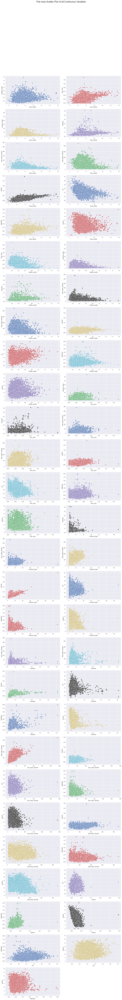

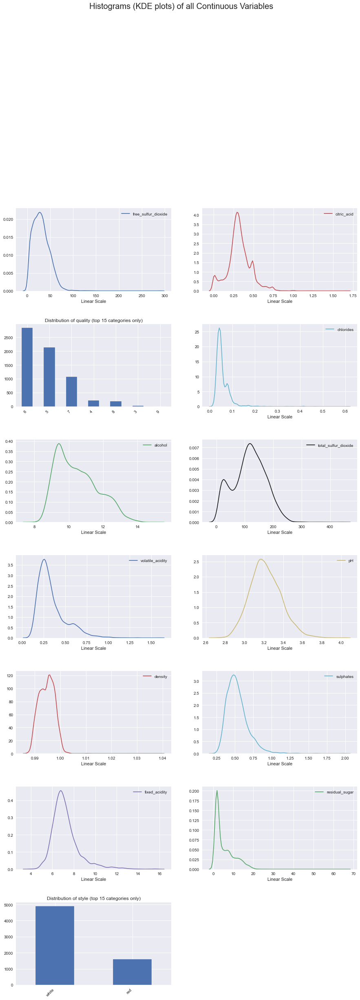

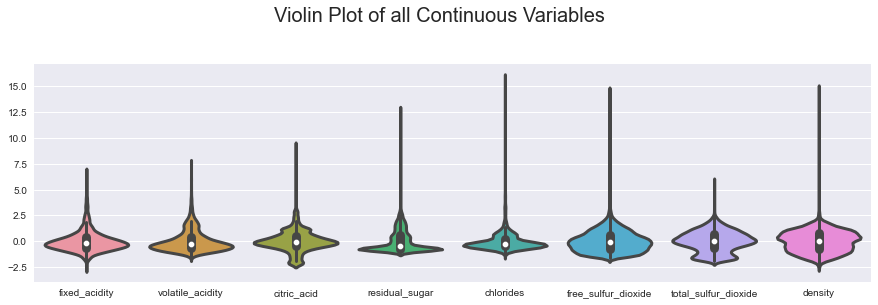

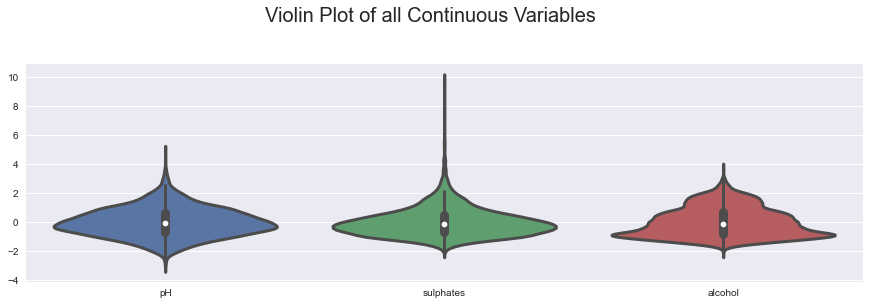

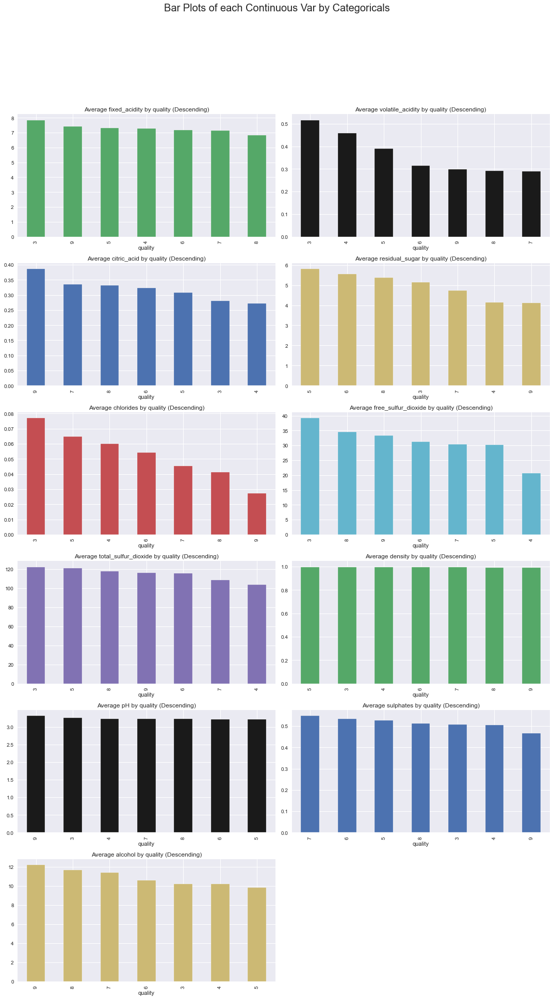

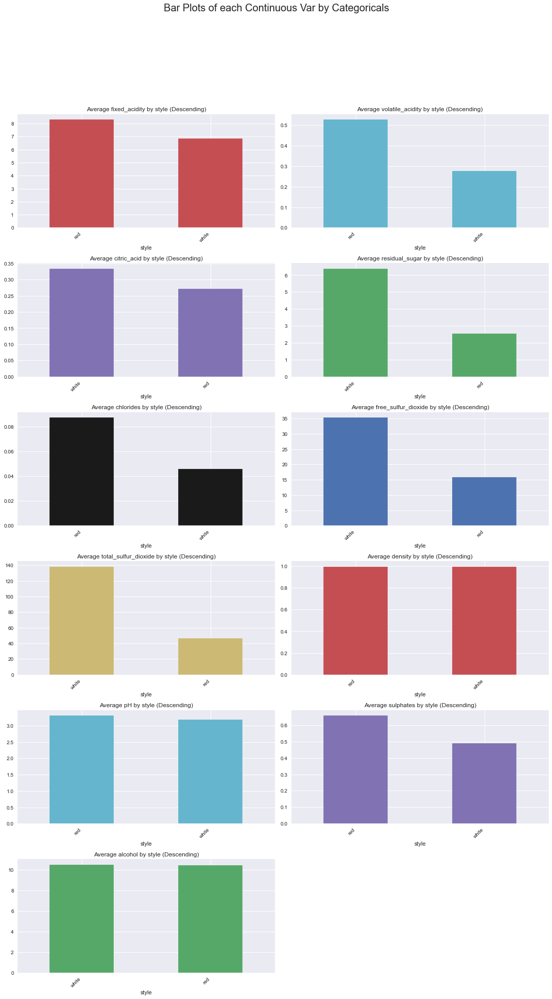

In [106]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df = AV.AutoViz ("wine_dataset.csv")

# Fim